# Making Mosaics with Archive Data

This notebook uses a utility function (included with the notebook) to tie together several Montage processing steps, including remote archive searching, image reprojection, and background matching, to produce a single wavelength mosaic of a region of the sky. The region center, size and the archive dataset are all free parameters.  

Later, we will process two more wavelengths and combine the results into a 3-color PNG rendering.

This specific mosaic builder does not reflect all of the capabilities of Montage; doing so would make it much too complicated for simple use.  For instance, if you want to build mosaics to match the projection and pixel scale for some other custom data, you can build this yourself using the individual Montage modules directly.

Run the following cell to see a list of input parameters for the Mosaic object:

In [4]:
%pycat parameters.txt

and the following cell to get a list of available archive datasets:

In [5]:
%pycat datasets.txt

### Mosaic

In [6]:
from Mosaic import Mosaic

Mosaic(location='M51', dataset='SDSS u', size=0.2, outfile='sdss_u.fits', verbose=True)

'Constructing region header specification ...'

'Downloading image data ...'

'Collecting metadata for 6 images ...'

'Reprojecting images ...'

'Collecting projected image metadata ...'

'Determining image overlaps for background modeling ...'

'Analyzing 11 image overlaps ...'

'Modeling background corrections ...'

'Applying background corrections ...'

'Collecting corrected image metadata ...'

'Coadding corrected images into final mosaic ...'

'Final mosaic image: sdss_u.fits'

### Viewer

The output above is a verbose description of the steps in the processing.  Useful information, but once we are sure everything is working correctly we will switch to terse messages for compactness.  The simplest way evaluate the processing is to take a look at the mosaic using the Montage FITS image renderer mViewer:

In [7]:
from MontagePy.main import mViewer
from IPython.display import Image

status = mViewer('-ct 1 -gray sdss_u.fits -2s max gaussian-log', 'sdss_u.png', mode=2)

Assuming the above rendering worked properly, we can use a built-in notebook PNG viewer to look at it.

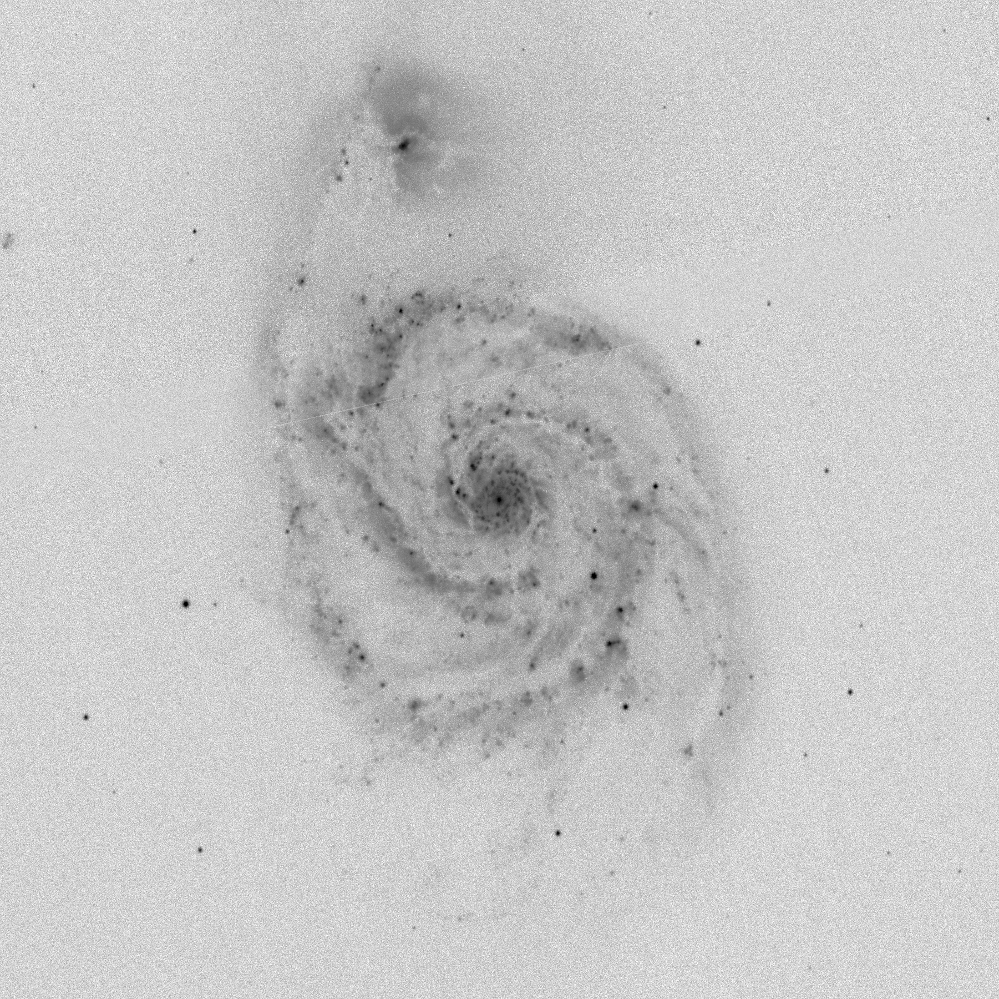

In [8]:
Image(filename='sdss_u.png')

### Other wavelengths

To make a full-color image, we need two more bands:

In [9]:
Mosaic(location='M51', dataset='SDSS g', size=0.2, outfile='sdss_g.fits', verbose=False)

'Final mosaic image: sdss_g.fits'

In [10]:
Mosaic(location='M51', dataset='SDSS r', size=0.2, outfile='sdss_r.fits', verbose=False)

'Final mosaic image: sdss_r.fits'

### 3-Color PNG

In addition to the simple grayscale representation above, the Montage viewer can combine multiple wavelengths into a color image.  It can also add various overlays.  For maximum flexibility, it has two parameter input modes.  The simpler one (used above) allows for all the parameters to be given in a simple string.  The same syntax is used in the standalone mViewer command.  While this can also be used for more complex constructs, there is also a more structured mode that uses JSON to describe the image to generate:

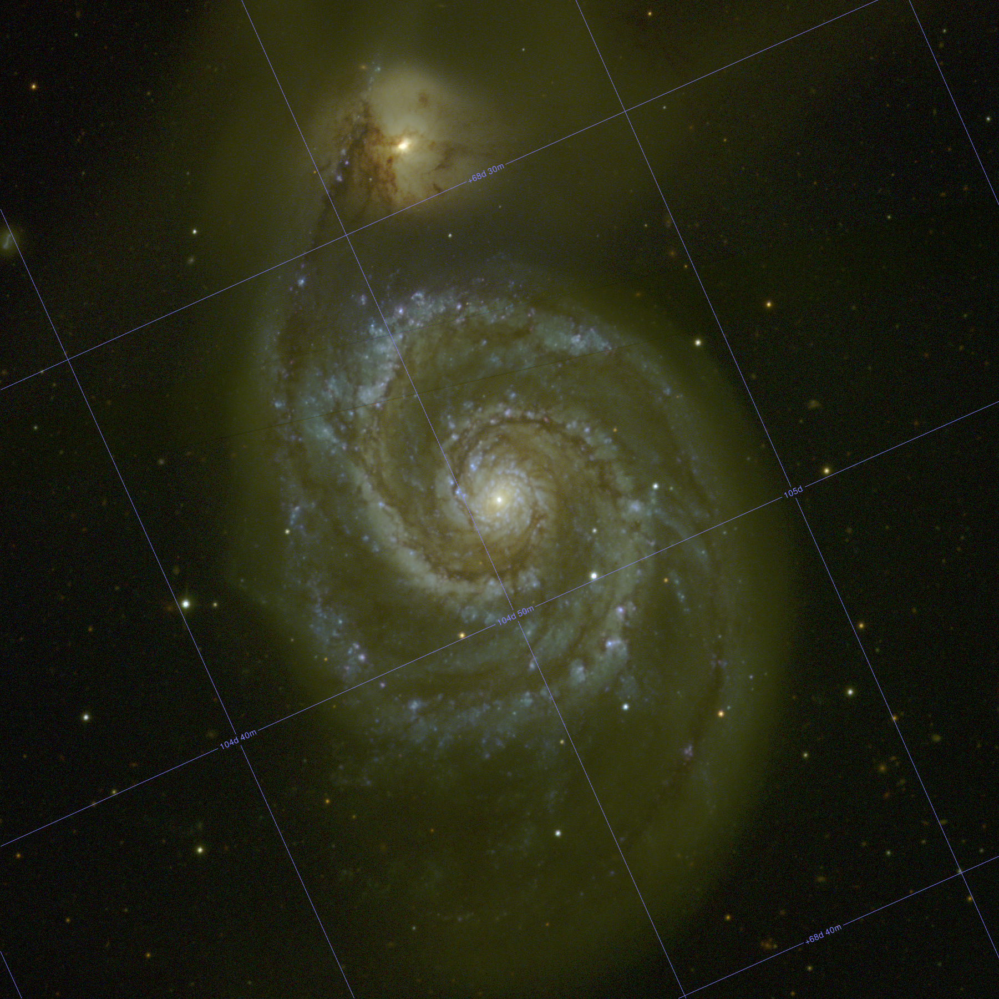

In [11]:
imgjson = """
{
   "image_type":"png",

    "blue_file":{"fits_file":"sdss_u.fits", "stretch_min":"-0.3s", "stretch_max":"max", "stretch_mode":"gaussian-log"},
   "green_file":{"fits_file":"sdss_g.fits", "stretch_min":"-0.3s", "stretch_max":"max", "stretch_mode":"gaussian-log"},
     "red_file":{"fits_file":"sdss_r.fits", "stretch_min":"-0.3s", "stretch_max":"max", "stretch_mode":"gaussian-log"},
   
     "overlays":[
      {"type":"grid", "coord_sys": "Galactic", "color":"8080ff"}
     ]   
}
"""

rtn = mViewer(imgjson, 'sdss_color.png', mode=1) 

Image(filename='sdss_color.png')